# Microglia State Mapping — scVI → scANVI Reference Mapping

**Strategy:** Train scVI + scANVI on the **reference only**, then use `load_query_data` (scArches surgery) to map the query into the reference latent space and predict labels.

Follows: [scvi-tools scArches tutorial](https://docs.scvi-tools.org/en/1.0.0/tutorials/notebooks/scarches_scvi_tools.html)

In [1]:
%load_ext autoreload
%autoreload 2

import scanpy as sc
import scvi
import anndata
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

scvi.settings.seed = 42
print(f"scvi-tools: {scvi.__version__}, scanpy: {sc.__version__}")

Seed set to 42


scvi-tools: 1.4.0.post1, scanpy: 1.11.5


/tmp/ipykernel_858438/525475056.py:13: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('scanpy')` instead
  print(f"scvi-tools: {scvi.__version__}, scanpy: {sc.__version__}")


In [2]:
# ── Config ──────────────────────────────────────────────────────
BASE_PATH = "/home/gdallagl/myworkdir/XDP/data/_old/microglia_scVI"

REF_PATH   = "/home/gdallagl/myworkdir/XDP/data/XDP/microglia_states/Microglia_final1.h5ad"

QUERY_NAME="NucSeq" # NucSeq, SlideTag
if QUERY_NAME == "NucSeq":
    QUERY_PATH = "/home/gdallagl/myworkdir/XDP/data/XDP/NucSec/adatas/Striatum/Striatum_combined_QC_mmc_ct-cured_zoned.h5ad"
elif QUERY_NAME == "SlideTag":
    QUERY_PATH = "/home/gdallagl/myworkdir/XDP/data/XDP/SlideTags_dataset/all_lib_adata_zoned_ct-cured.h5ad"

REF_CELL_TYPE_COL = "finalcluster"   # cell-type annotation in reference
REF_BATCH_COL     = "Sample"         # batch column in reference
QUERY_BATCH_COL   = "donor_id"       # batch column in query

LABELS_KEY        = "celltype_scanvi"
UNLABELLED        = "Unknown"

N_TOP_GENES         = 3000
SCVI_MAX_EPOCHS     = 50           # reference training
SCANVI_MAX_EPOCHS   = 30            # label-aware fine-tuning on reference
SURGERY_EPOCHS      = 40           # query mapping (surgery fine-tuning)
N_SAMPLES_PER_LABEL = 100
BATCH_SIZE          = 512

## 1 · Load reference

In [3]:
ref = sc.read_h5ad(REF_PATH)
print(ref)
print(ref.obs[REF_CELL_TYPE_COL].value_counts())

AnnData object with n_obs × n_vars = 266891 × 32743
    obs: 'Sample', 'nCount_RNA', 'nFeature_RNA', 'mitoRatio', 'Cohort', 'Batch', 'predicted_class', 'predicted_state', 'Class_celltypist_label', 'doublet_scores', 'source', 'leiden_060', 'leiden_080', 'leiden_080_temp', 'cluster1', 'state', 'cluster2', 'cluster3', 'finalcluster'
    uns: 'cluster1', 'cluster2_colors', 'cluster3_colors', 'cluster4', 'leiden_060', 'leiden_060_colors', 'leiden_080', 'leiden_080_temp_colors', 'neighbors', 'state_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'
finalcluster
HM1                  96943
HM2                  42036
TM3                  37384
TM1                  26133
GPNMB_EYA2           18326
HM3                  12401
LPL_CD83             10250
TM2                   7229
Prolif                5698
CRM_CCL3              3900
Macrophage            3629
Myleoid_Monocytes     2962
Name: count, dtype: int64


## 2 · Load query

In [3]:
query = sc.read_h5ad(QUERY_PATH, backed="r")
query = query[query.obs["ct_for_deg"].isin(["Microglia", "Macrophages", "Monocytes"])].to_memory().copy()
print(f"Query: {query.shape}")
query.obs["ct_for_deg"].value_counts()

Query: (10710, 38601)


ct_for_deg
Microglia      9868
Macrophages     761
Monocytes        81
Name: count, dtype: int64

## 3 · Align gene names

In [5]:
# Make sure both use gene symbols as var index
if "gene_symbol" in query.var.columns:
    query.var.set_index("gene_symbol", inplace=True, drop=False)

overlap = set(ref.var_names) & set(query.var_names)
print(f"Ref: {ref.n_vars}, Query: {query.n_vars}, Overlap: {len(overlap)}")

Ref: 32743, Query: 38601, Overlap: 30557


## 4 · Prepare reference

- counts
- obs col
- too small batches
- ATTENTION: ONLY HVG

In [6]:
# Ensure raw counts are stored in a layer
ref.layers["counts"] = ref.X.copy()

sc.pp.normalize_total(ref, target_sum=1e4, layer="counts")
sc.pp.log1p(ref)
ref.layers["log1p_norm"] = ref.X.copy()

ref.X = ref.layers["counts"].copy()



# Batch column
ref.obs[LABELS_KEY] = ref.obs[REF_CELL_TYPE_COL].astype(str)
ref.obs["dataset"]  = "reference"

# Remove tiny batches
batch_counts = ref.obs[REF_BATCH_COL].value_counts()
ref = ref[ref.obs[REF_BATCH_COL].isin(batch_counts[batch_counts >= 100].index)].copy()

# HVG selection on reference only
sc.pp.highly_variable_genes(
    ref, n_top_genes=N_TOP_GENES, flavor="seurat_v3", layer="counts"
)
ref = ref[:, ref.var.highly_variable].copy()
print(f"Reference after HVG: {ref.shape}")
print(ref.obs[LABELS_KEY].value_counts())

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  return fn(*args_all, **kw)


Reference after HVG: (238393, 3000)
celltype_scanvi
HM1                  86550
HM2                  37904
TM3                  33257
TM1                  23349
GPNMB_EYA2           16488
HM3                  11108
LPL_CD83              9171
TM2                   6370
Prolif                5125
CRM_CCL3              3413
Macrophage            3190
Myleoid_Monocytes     2468
Name: count, dtype: int64


## 5 · Prepare query

In [7]:
# Ensure raw counts in a layer
query.layers["counts"] = query.X.copy()

# Prefix batch names to avoid collisions with reference
query.obs[REF_BATCH_COL] = "query_" + query.obs[QUERY_BATCH_COL].astype(str)
query.obs[LABELS_KEY]    = UNLABELLED
query.obs["dataset"]     = "query"

# Remove tiny batches
batch_counts = query.obs[REF_BATCH_COL].value_counts()
query = query[query.obs[REF_BATCH_COL].isin(batch_counts[batch_counts >= 100].index)].copy()
print(f"Query after filtering: {query.shape}")

Query after filtering: (10375, 38601)


## 6 · Train scVI on reference only

Using `arches_params` (layer norm, encode covariates) so the model is compatible with scArches surgery later.

In [8]:
# scArches-compatible parameters
arches_params = dict(
    use_layer_norm="both", # LayerNorm in encoder AND decoder
        # Layer norm can be thought of as batch norm but per cell Project name not set — it normalises each cell independently, so it doesn't depend on which cells happen to be in the mini-batch. This means surgery doesn't break the normalisation.
    use_batch_norm="none", # needed for scarches
        # When you later fine-tune on query data only, the batch statistics shift — the means and variances the model learned from reference data get overwritten by
    encode_covariates=True, # allows scArches to map new batches in the encoder to the existing data and thereby provides batch integration.
    dropout_rate=0.2,
    n_layers=2,
    n_latent=30,
    gene_likelihood="nb",
)

# registration step: tells futue model where to find data in adata --> write in adata written varibales
    # layer to use
    # batch key
scvi.model.SCVI.setup_anndata(ref, layer="counts", batch_key=REF_BATCH_COL)

# create the model
scvi_ref = scvi.model.SCVI(ref, **arches_params)

scvi_ref.train(
    max_epochs=SCVI_MAX_EPOCHS,
    early_stopping=True,
    batch_size=BATCH_SIZE,
    datasplitter_kwargs={"num_workers": 16},
)

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Training:   0%|          | 0/50 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=50` reached.


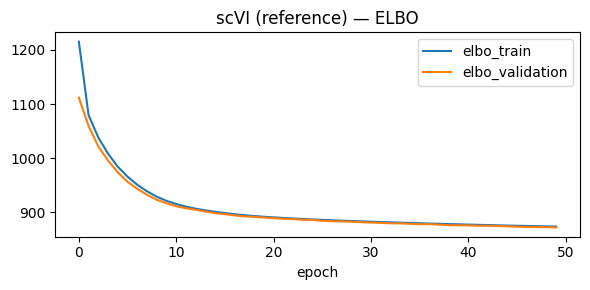

In [9]:
fig, ax = plt.subplots(figsize=(6, 3))
scvi_ref.history["elbo_train"].plot(ax=ax, label="train")
scvi_ref.history["elbo_validation"].plot(ax=ax, label="validation")
ax.set(title="scVI (reference) — ELBO"); ax.legend()
plt.tight_layout(); plt.show()

## 7 · Train scANVI on reference only

Initialise from the pre-trained scVI, add cell-type labels. All reference cells are labelled; `Unknown` category exists only for future query data.

In [10]:
# Create scANVI labels column (all ref cells are labelled)
ref.obs[LABELS_KEY] = ref.obs[REF_CELL_TYPE_COL].astype(str)

# Intialise scanvi modle from past scvi model
# add
    # classfier head (for cell type prediction)
scanvi_ref = scvi.model.SCANVI.from_scvi_model(
    scvi_ref,
    unlabeled_category=UNLABELLED,
    labels_key=LABELS_KEY,
)

# Fine tuine uing cell types
scanvi_ref.train(
    max_epochs=SCANVI_MAX_EPOCHS,
    n_samples_per_label=N_SAMPLES_PER_LABEL, #each mini-batch needs a mix of cell types.
        # controls how many cells per cell type are sampled into each epoch's training set.
        # Setting it to 100 means: for each epoch, take 100 cells from each cell type (sampled with replacement for small classes), then shuffle those together into mini-batches
    batch_size=BATCH_SIZE,
    datasplitter_kwargs={"num_workers": 16},
)

INFO     Training for 30 epochs.                                                                                   


/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.


Training:   0%|          | 0/30 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=30` reached.


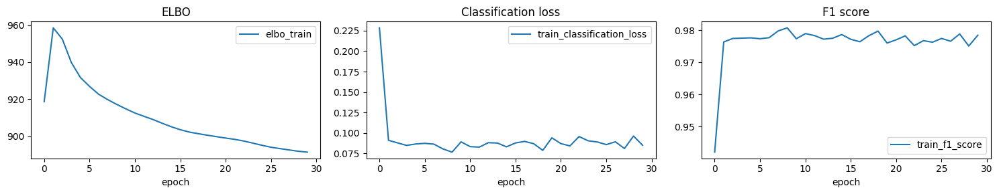

In [11]:
fig, axes = plt.subplots(1, 3, figsize=(15, 3))
scanvi_ref.history["elbo_train"].plot(ax=axes[0], title="ELBO")
scanvi_ref.history["train_classification_loss"].plot(ax=axes[1], title="Classification loss")
scanvi_ref.history["train_f1_score"].plot(ax=axes[2], title="F1 score")
plt.tight_layout(); plt.show()

# ATTENTION: initial spike
    # When from_scvi_model adds the classifier head, it temporarily disrupts the reconstruction — the model needs a few epochs to rebalance the reconstruction loss with the new classification objective

## 8 · Inspect reference latent space

In [12]:
ref.obsm["X_scANVI"] = scanvi_ref.get_latent_representation()

print("Calculating neighbors and UMAP on scANVI latent space...")
sc.pp.neighbors(ref, use_rep="X_scANVI", key_added="scANVI_neighbors")
print("Calculating UMAP...")
sc.tl.umap(ref, neighbors_key="scANVI_neighbors", min_dist=0.3)

Calculating neighbors and UMAP on scANVI latent space...
Calculating UMAP...


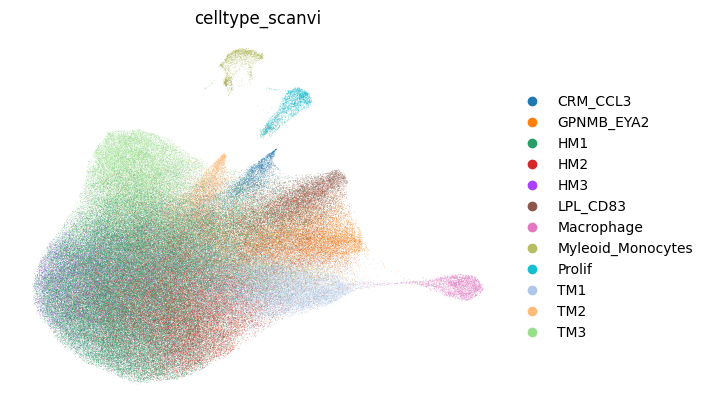

In [13]:
sc.pl.umap(ref, color=[LABELS_KEY], ncols=2, frameon=False)

Reference self-accuracy: 0.5031

                   precision    recall  f1-score   support

         CRM_CCL3       0.37      0.84      0.51      3413
       GPNMB_EYA2       0.46      0.55      0.50     16488
              HM1       0.72      0.34      0.46     86550
              HM2       0.42      0.34      0.38     37904
              HM3       0.21      0.61      0.32     11108
         LPL_CD83       0.40      0.74      0.52      9171
       Macrophage       0.86      0.97      0.91      3190
Myleoid_Monocytes       0.63      0.96      0.76      2468
           Prolif       0.38      0.76      0.51      5125
              TM1       0.61      0.64      0.62     23349
              TM2       0.35      0.77      0.48      6370
              TM3       0.68      0.68      0.68     33257

         accuracy                           0.50    238393
        macro avg       0.51      0.68      0.55    238393
     weighted avg       0.58      0.50      0.50    238393



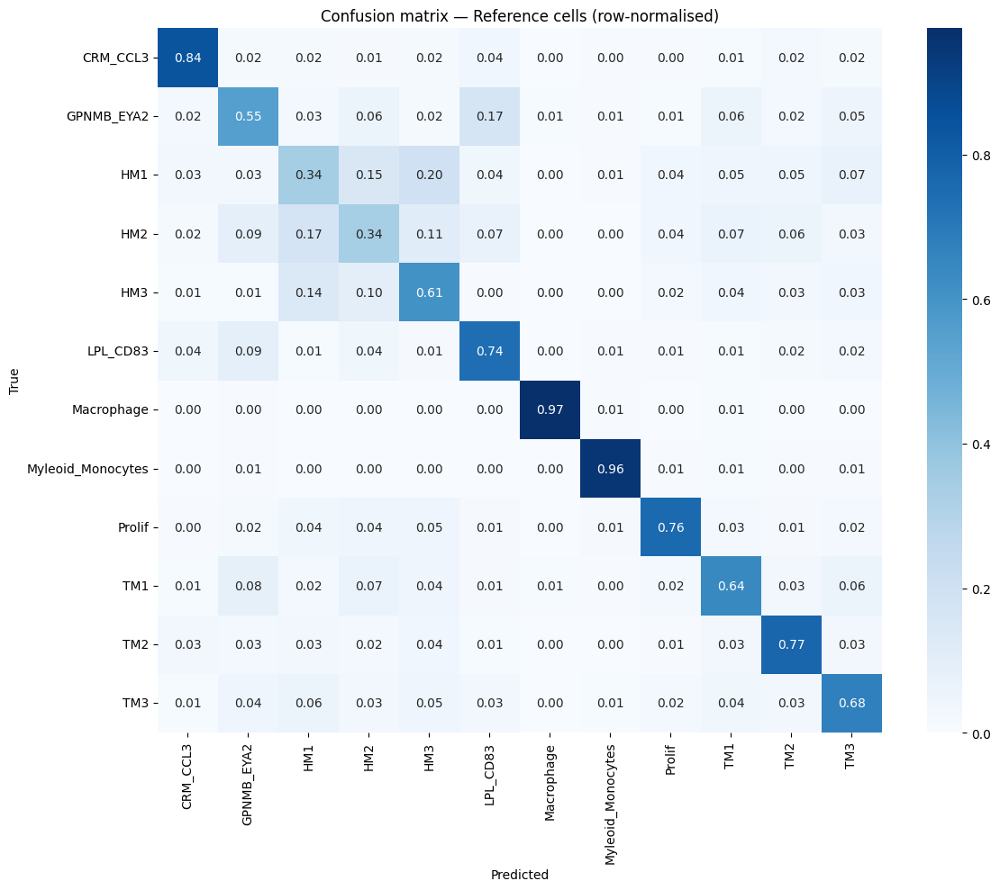

In [14]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Predict on reference using the surgery model
ref_preds = scanvi_ref.predict(ref)
ref_true  = ref.obs[LABELS_KEY]
labels    = sorted(ref_true.unique())

# Accuracy + classification report
print(f"Reference self-accuracy: {(ref_true == ref_preds).mean():.4f}\n")
print(classification_report(ref_true, ref_preds, target_names=labels, zero_division=0))

# Confusion matrix
cm = confusion_matrix(ref_true, ref_preds, labels=labels, normalize="true")
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt=".2f", cmap="Blues",
            xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion matrix — Reference cells (row-normalised)")
plt.tight_layout()
plt.show()

## 9 · Save reference model

In [15]:
ref_model_dir = f"{BASE_PATH}/models/scanvi_ref/"
os.makedirs(ref_model_dir, exist_ok=True)
scanvi_ref.save(ref_model_dir, overwrite=True)
print(f"Reference model saved to {ref_model_dir}")

Reference model saved to /home/gdallagl/myworkdir/XDP/data/_old/microglia_scVI/models/scanvi_ref/


## 10 · Map query via scArches surgery

`prepare_query_anndata` aligns query genes to reference.
`load_query_data` loads the pre-trained model and adds new batch embeddings for the query.
Training fine-tunes only the new parameters (few epochs).

In [16]:
# Align query vars to match reference model
    # subset to same genes
    # genes in same order
    # pad missing genes wiht 0
scvi.model.SCANVI.prepare_query_anndata(query, ref_model_dir)

# Load reference model with query data (scArches surgery)
    # load scanvi trained model
    # detecte new batches in query (not present in reference
    # add new neurosn to intial layer (scArches startegy)
scanvi_query = scvi.model.SCANVI.load_query_data(query, ref_model_dir)

# Fine-tune on query 
    # only new batch embeddings are unfrozen
    # only query is used to retrain
scanvi_query.train(
    max_epochs=SURGERY_EPOCHS,
    batch_size=BATCH_SIZE,
    plan_kwargs={"weight_decay": 0.0},
    datasplitter_kwargs={"num_workers": 16},
)

INFO     File /home/gdallagl/myworkdir/XDP/data/_old/microglia_scVI/models/scanvi_ref/model.pt already downloaded  


INFO     Found 92.96666666666667% reference vars in query data.                                                    
INFO     File /home/gdallagl/myworkdir/XDP/data/_old/microglia_scVI/models/scanvi_ref/model.pt already downloaded  
INFO     Training for 40 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.
/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:534: Found 85 module(s) in eval mode at the start of training. This may lead to unexpected behavior during training. If this is intentional, you can ignore this warning.


Training:   0%|          | 0/40 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=40` reached.


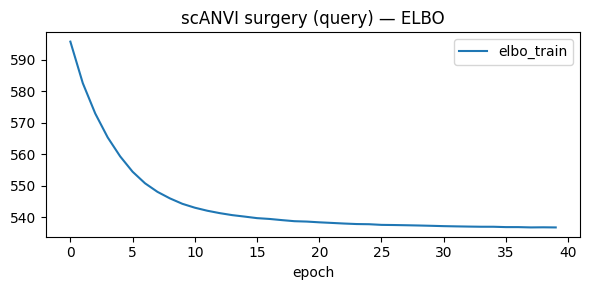

In [17]:
fig, ax = plt.subplots(figsize=(6, 3))
for key in scanvi_query.history:
    if "elbo" in key:
        scanvi_query.history[key].plot(ax=ax, label=key)
ax.set(title="scANVI surgery (query) — ELBO"); ax.legend()
plt.tight_layout(); plt.show()

## 11 · Predict labels for query cells

In [18]:
# HARD prediction
query.obs["predicted_scanvi"] = scanvi_query.predict()

# Soft predictions (full probaibly table)
pred_probs = scanvi_query.predict(soft=True) # dataframe
query.obs["prediction_confidence"] = pred_probs.max(axis=1).values # save prob of most likely class as confidence score

print("Query predictions:")
print(query.obs["predicted_scanvi"].value_counts())
print(f"\nMedian confidence: {query.obs['prediction_confidence'].median():.3f}")

Query predictions:
predicted_scanvi
HM1                  2692
TM1                  1660
TM2                  1330
CRM_CCL3              967
GPNMB_EYA2            950
HM2                   752
TM3                   635
LPL_CD83              476
Macrophage            392
HM3                   375
Prolif                109
Myleoid_Monocytes      37
Name: count, dtype: int64

Median confidence: 0.996


## 12 · Joint visualisation (ref + query)

Getting latent representations for reference and query...
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


Concatenating reference and query for joint visualization...
Creating combined label column for visualization...
Calculating neighbors on scANVI latent space...
Calculating UMAP...


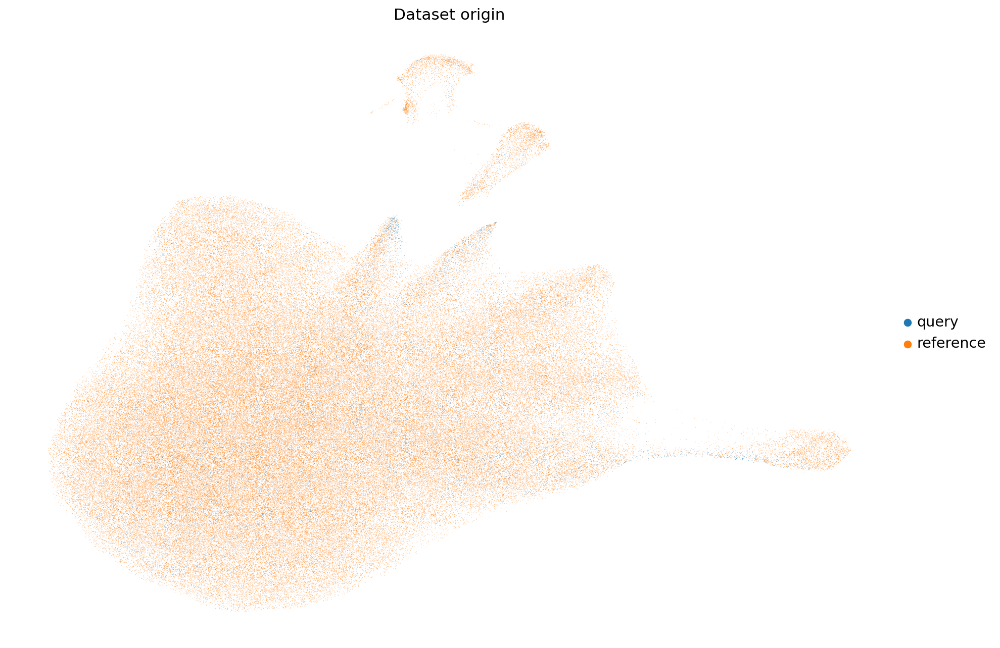

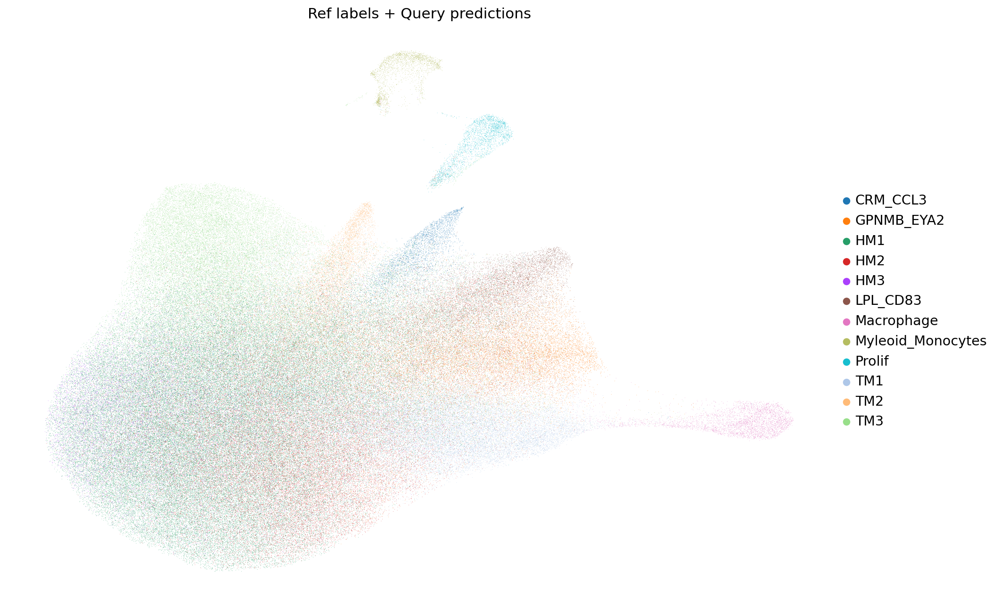

In [19]:
# Get ref latent from the query model (ensures same space)
    # ATTENTION: from NEW model
print("Getting latent representations for reference and query...")
ref.obsm["X_scANVI"] = scanvi_query.get_latent_representation(ref)
query.obsm["X_scANVI"] = scanvi_query.get_latent_representation()

# Convert all categoricals to strings before concat
for obj in [ref, query]:
    for col in obj.obs.select_dtypes("category").columns:
        obj.obs[col] = obj.obs[col].astype(str)

# add predicted labels to ref for plotting (will be same as ground truth)
ref.obs["predicted_scanvi"] = ref.obs[LABELS_KEY]  # for ref, prediction = ground truth

# Concatenate for plotting
print("Concatenating reference and query for joint visualization...")
adata_full = anndata.concat([ref, query], join="inner")
adata_full.obs_names_make_unique()
adata_full.obsm["X_scANVI"] = np.vstack([ref.obsm["X_scANVI"], query.obsm["X_scANVI"]])

# Combined label column: ground truth for ref, prediction for query
print("Creating combined label column for visualization...")
adata_full.obs["label_combined"] = adata_full.obs[LABELS_KEY].copy()
q_mask = adata_full.obs["dataset"] == "query"
adata_full.obs.loc[q_mask, "label_combined"] = adata_full.obs.loc[q_mask, "predicted_scanvi"]

# Neighbors + UMAP with specific names
print("Calculating neighbors on scANVI latent space...")
sc.pp.neighbors(adata_full, use_rep="X_scANVI", key_added="scANVI_neighbors")
print("Calculating UMAP...")
sc.tl.umap(adata_full, neighbors_key="scANVI_neighbors", min_dist=0.3)
adata_full.obsm["X_umap_scANVI"] = adata_full.obsm["X_umap"].copy()  # save with specific name

sc.settings.set_figure_params(figsize=(14, 10))
sc.pl.embedding(adata_full, basis="X_umap_scANVI", color="dataset",frameon=False, title="Dataset origin")
sc.pl.embedding(adata_full, basis="X_umap_scANVI", color="label_combined", frameon=False, title="Ref labels + Query predictions")

## 13 · Confidence filtering and Query mapping

predictions the model is unsure about

In [20]:
CONF_THRESHOLD = 0.8

n_query = query.n_obs
# prediction_confidence is the max probability from the soft predictions
n_high  = (query.obs["prediction_confidence"] >= CONF_THRESHOLD).sum()
print(f"High confidence (>= {CONF_THRESHOLD}): {n_high}/{n_query} ({100*n_high/n_query:.1f}%)")

query.obs["predicted_filtered"] = query.obs["predicted_scanvi"].copy()
query.obs.loc[query.obs["prediction_confidence"] < CONF_THRESHOLD, "predicted_filtered"] = "Low_confidence"

sc.pp.neighbors(query, use_rep="X_scANVI", key_added="scANVI_neighbors")
sc.tl.umap(query, neighbors_key="scANVI_neighbors", min_dist=0.3)
query.obsm["X_umap_scANVI"] = query.obsm["X_umap"].copy()

High confidence (>= 0.8): 8694/10375 (83.8%)


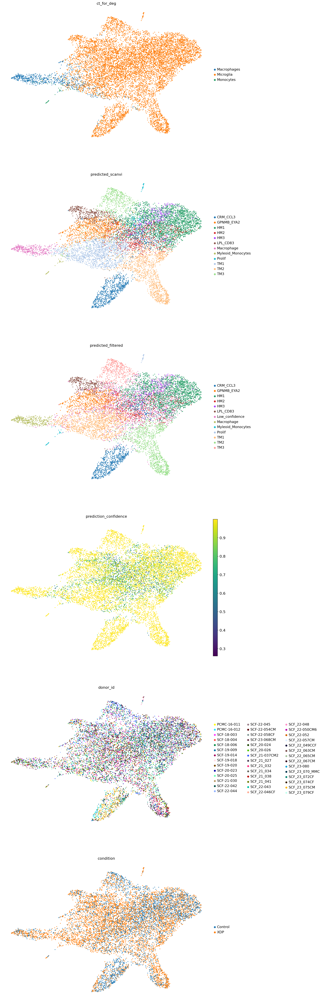

In [36]:
sc.pl.embedding(query, basis="X_umap_scANVI",
                color=["ct_for_deg", 
                       "predicted_scanvi", "predicted_filtered", "prediction_confidence", 
                       "donor_id", "condition"],
                ncols=1, frameon=False, size=30)

## 14 · Sanity check — reference self-accuracy

Reference self-accuracy: 0.5031

                   precision    recall  f1-score   support

         CRM_CCL3       0.37      0.84      0.51      3413
       GPNMB_EYA2       0.46      0.55      0.50     16488
              HM1       0.72      0.34      0.46     86550
              HM2       0.42      0.34      0.38     37904
              HM3       0.21      0.61      0.32     11108
         LPL_CD83       0.40      0.74      0.52      9171
       Macrophage       0.86      0.97      0.91      3190
Myleoid_Monocytes       0.63      0.96      0.76      2468
           Prolif       0.38      0.76      0.51      5125
              TM1       0.61      0.64      0.62     23349
              TM2       0.35      0.77      0.48      6370
              TM3       0.68      0.68      0.68     33257

         accuracy                           0.50    238393
        macro avg       0.51      0.68      0.55    238393
     weighted avg       0.58      0.50      0.50    238393



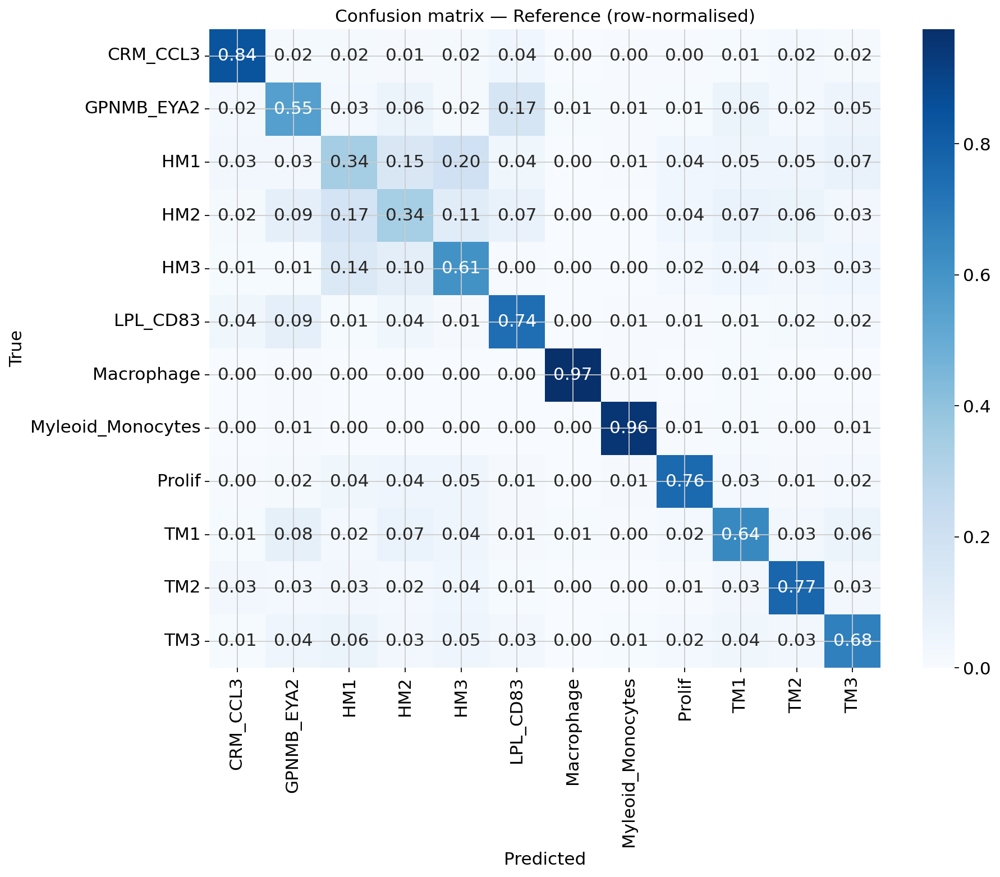

In [22]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

ref_preds = scanvi_query.predict(ref)
ref_true  = ref.obs[LABELS_KEY]
labels    = sorted(ref_true.unique())

print(f"Reference self-accuracy: {(ref_true == ref_preds).mean():.4f}\n")
print(classification_report(ref_true, ref_preds, target_names=labels, zero_division=0))

cm = confusion_matrix(ref_true, ref_preds, labels=labels, normalize="true")
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt=".2f", cmap="Blues", xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted"); plt.ylabel("True")
plt.title("Confusion matrix — Reference (row-normalised)")
plt.tight_layout(); plt.show()

### Check gene markers

In [23]:

# Run DE analysis grouped by your cluster column

sc.tl.rank_genes_groups(
    ref, 
    groupby=REF_CELL_TYPE_COL, 
    method='wilcoxon', 
    layer="log1p_norm", 
    min_in_group_fraction=0.4,   # gene expressed in ≥40% of the TARGET cluster
    max_out_group_fraction=0.1,  # gene expressed in ≤10% of the OTHER cluster
    key_added='wilcoxon'
)

sc.tl.rank_genes_groups(
    query, 
    groupby='predicted_filtered', 
    method='wilcoxon', 
    layer="log1p_norm", 
    min_in_group_fraction=0.4,   # gene expressed in ≥40% of the TARGET cluster
    max_out_group_fraction=0.1,  # gene expressed in ≤10% of the OTHER cluster
    key_added='wilcoxon'
)

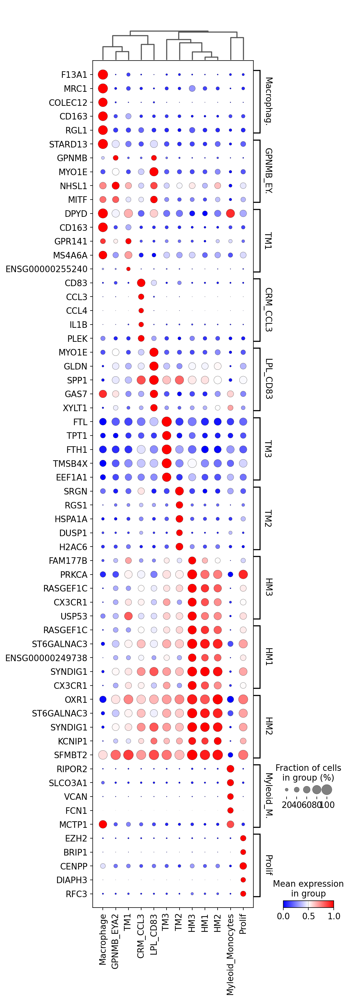

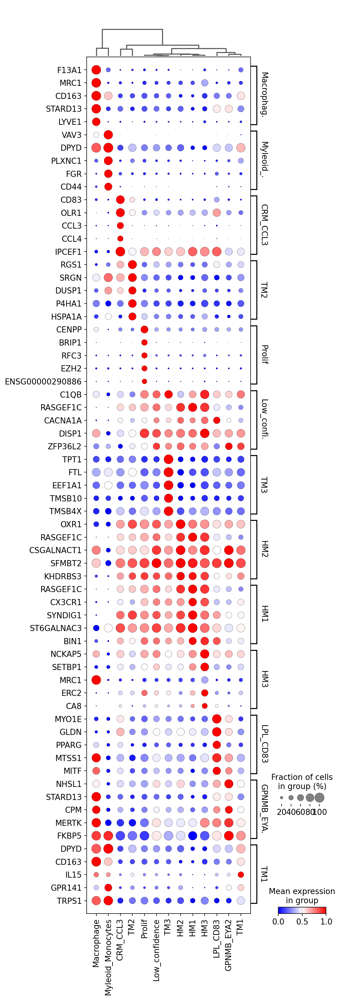

In [24]:
# sc.pl.rank_genes_groups_heatmap(
#     REF,
#     n_genes=5,
#     key='wilcoxon',
#     groupby=REF_CELL_TYPE_COL,
#     use_raw=False,
#     layer='log1p_norm',          # ← use the normalized counts, not scaled
#     standard_scale='var',        # ← rescale each gene 0–1 across groups (for visual clarity)
#     swap_axes=True,
#     show_gene_labels=True,
#     cmap='bwr',             # better than bwr for this use case
# )
# sc.pl.rank_genes_groups_heatmap(
#     query,
#     n_genes=5,
#     key='wilcoxon',
#     groupby='predicted_filtered',
#     use_raw=False,
#     layer='log1p_norm',          # ← use the normalized counts, not scaled
#     standard_scale='var',        # ← rescale each gene 0–1 across groups (for visual clarity)
#     swap_axes=True,
#     show_gene_labels=True,
#     cmap='bwr',             # better than bwr for this use case
# )

sc.pl.rank_genes_groups_dotplot(
    ref,
    n_genes=5,
    key='wilcoxon',
    groupby=REF_CELL_TYPE_COL,
    use_raw=False,
    layer='log1p_norm',          # same as your heatmap
    standard_scale='var',        # keep for comparability
    swap_axes=True,
    cmap='bwr',
)
sc.pl.rank_genes_groups_dotplot(
    query,
    n_genes=5,
    key='wilcoxon',
    groupby='predicted_filtered',
    use_raw=False,
    layer='log1p_norm',          # same as your heatmap
    standard_scale='var',        # keep for comparability
    swap_axes=True,
    cmap='bwr',
)

### Check with knwown marlers

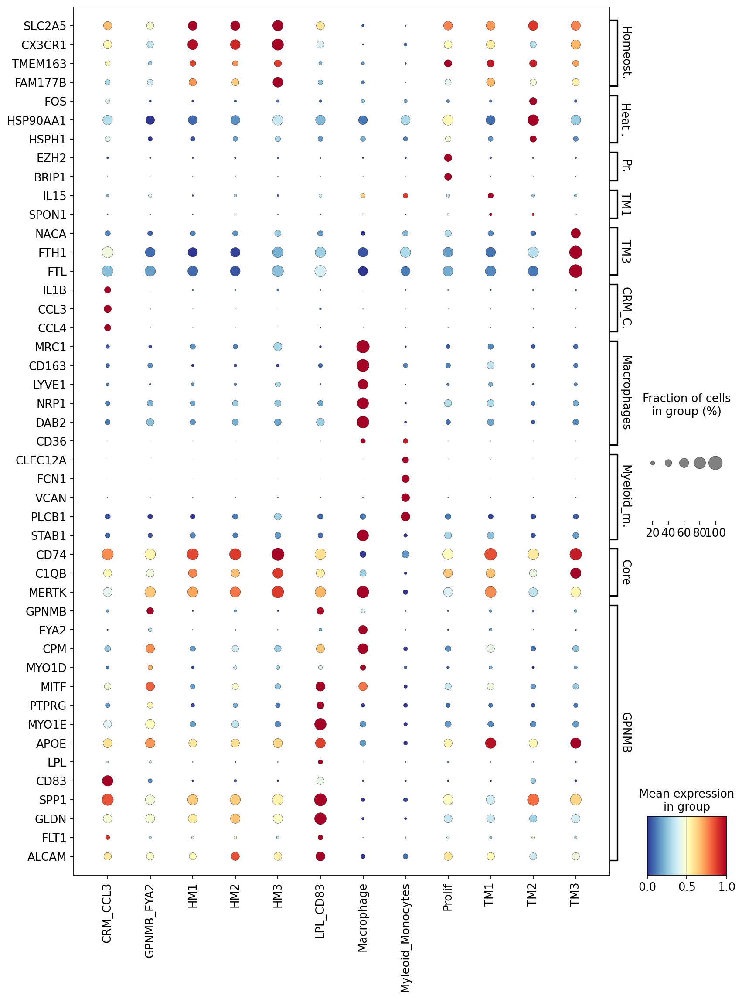

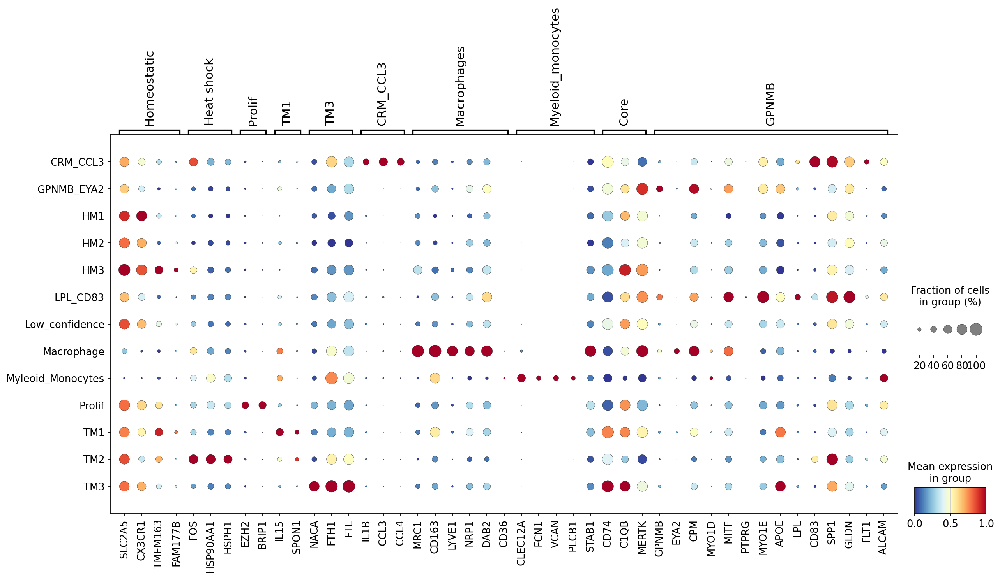

In [35]:
# First, filter to genes that actually exist in your object
gene_groups = {

    "Homeostatic": ["SLC2A5", "CX3CR1", "MEF2C", "P2RY12", "TMEM163", "NAV3", "CSF1R", "FAM177B", "SRGAP2"],

    "Heat shock": ["JUNB", "FOS", "HSP90AA1", "HSPH1"],

    "Prolif": ["EZH2", "BRIP1"],

    "TM1": ["IL15", "SPON1", "LRRK2", "IFIT3"],

    "TM3": ["NACA", "FTH1", "FTL", "TYROBP", "SOD1"],

    "CRM_CCL3": ["IL1B", "CCL3", "CCL4"],

    "Macrophages": ["MRC1", "CD163", "LYVE1", "NRP1", "DAB2", "CD36", "CD38", "PTPRC"],

    "Myeloid_monocytes": ["CCR2", "CLEC12A", "FCN1", "VCAN", "PLCB1", "STAB1", "MS4A7"],

    "Core": ["CD74", "C1QA", "C1QB", "FPR1",
            "ITPR2", "HAVCR2", "MERTK", "GAS6", "ITGAM", "LPAR6", "ITM2B", "CST3", "MAF",
            "SORL1", "PICALM"],

    "GPNMB": ["GPNMB", "EYA2", "CPM", "RRAGD", "MYO1D", "MITF", "PTPRG", "ITGAX", "MYO1E",
            "TREM2", "APOE", "GRN", "SULT1C2",
            "PDE8A", "LPL", "CD83", "SMAD3", "SPP1", "GLDN", "FLT1", "ALCAM"],
}

# Flatten while preserving order
var_names = []
var_group_positions = []
var_group_labels = []

start = 0
for group, genes in gene_groups.items():
    genes_present = [g for g in genes if g in query.var_names]
    if len(genes_present) == 0:
        continue

    var_names.extend(genes_present)
    end = start + len(genes_present) - 1

    var_group_positions.append((start, end))
    var_group_labels.append(group)

    start = end + 1

sc.pl.dotplot(
    ref,
    var_names=var_names,
    groupby=REF_CELL_TYPE_COL,
    layer='log1p_norm',
    standard_scale='var',
    cmap='RdYlBu_r',
    swap_axes=True,
    figsize=(12, 16),
    var_group_positions=var_group_positions,
    var_group_labels=var_group_labels,
)
sc.pl.dotplot(
    query,
    var_names=var_names,
    groupby="predicted_filtered",
    layer='log1p_norm',
    standard_scale='var',
    cmap='RdYlBu_r',
    swap_axes=False,
    figsize=(18,8),
    var_group_positions=var_group_positions,
    var_group_labels=var_group_labels,
)

# sc.pl.matrixplot(
#     ref,
#     var_names=vahid_genes_present,   # same curated gene list
#     groupby=REF_CELL_TYPE_COL,       # grouping column
#     layer='log1p_norm',
#     use_raw=False,
#     standard_scale='var',            # same scaling as heatmap
#     cmap='viridis',
#     swap_axes=True,                  # same orientation
#     figsize=(20, 10),
#     dendrogram=False                 # optional: set True if you want clustering
# )
# sc.pl.matrixplot(
#     query,
#     var_names=vahid_genes_present,   # same curated gene list
#     groupby="predicted_filtered",       # grouping column
#     layer='log1p_norm',
#     use_raw=False,
#     standard_scale='var',            # same scaling as heatmap
#     cmap='viridis',
#     swap_axes=True,                  # same orientation
#     figsize=(20, 10),
#     dendrogram=False                 # optional: set True if you want clustering
# )

## 15 · Save results

In [ ]:
os.makedirs(f"{BASE_PATH}/{QUERY_NAME}/", exist_ok=True)
os.makedirs(f"{BASE_PATH}/models/", exist_ok=True)

# Save query with predictions
query.write(f"{BASE_PATH}/{QUERY_NAME}/query_mapped.h5ad")

# Save combined ref+query
adata_full.write(f"{BASE_PATH}/{QUERY_NAME}/combined_ref_query_mapped.h5ad")

# Save surgery model
scanvi_query.save(f"{BASE_PATH}/models/scanvi_query/", overwrite=True)
print("All saved.")

All saved.
